# Mount Google Drive

In [0]:
# Mount Drive agar bisa mengambil data dari google drive, lewati baris ini jika menggunakan Jupyter Notebook.
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
%cd /content/gdrive/My\ Drive/Colab\ Notebooks/

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive
/content/gdrive/My Drive/Colab Notebooks


## Importing Libraries

In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings

from sklearn.preprocessing import StandardScaler

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

from sklearn.model_selection import cross_val_score

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
import time

from sklearn.metrics import roc_curve, roc_auc_score

import scipy
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score
from sklearn.metrics import confusion_matrix, classification_report

from sklearn.externals import joblib
import copy

# Exploratory Data Analysis

## Importing Dataset

In [0]:
pd.set_option('display.max_rows', 755)
data = pd.read_csv('pd_speech_features.csv', header=1)
data

#Importing parkinson data
#target column is class
#predictor columns is all the columns except class and id
# Categorical : gender & class
# Numerical : all columns except gender & class 

,id,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,locAbsJitter,rapJitter,ppq5Jitter,ddpJitter,locShimmer,locDbShimmer,apq3Shimmer,apq5Shimmer,apq11Shimmer,ddaShimmer,meanAutoCorrHarmonicity,meanNoiseToHarmHarmonicity,meanHarmToNoiseHarmonicity,minIntensity,maxIntensity,meanIntensity,f1,f2,f3,f4,b1,b2,b3,b4,GQ_prc5_95,GQ_std_cycle_open,GQ_std_cycle_closed,GNE_mean,GNE_std,GNE_SNR_TKEO,...,tqwt_skewnessValue_dec_34,tqwt_skewnessValue_dec_35,tqwt_skewnessValue_dec_36,tqwt_kurtosisValue_dec_1,tqwt_kurtosisValue_dec_2,tqwt_kurtosisValue_dec_3,tqwt_kurtosisValue_dec_4,tqwt_kurtosisValue_dec_5,tqwt_kurtosisValue_dec_6,tqwt_kurtosisValue_dec_7,tqwt_kurtosisValue_dec_8,tqwt_kurtosisValue_dec_9,tqwt_kurtosisValue_dec_10,tqwt_kurtosisValue_dec_11,tqwt_kurtosisValue_dec_12,tqwt_kurtosisValue_dec_13,tqwt_kurtosisValue_dec_14,tqwt_kurtosisValue_dec_15,tqwt_kurtosisValue_dec_16,tqwt_kurtosisValue_dec_17,tqwt_kurtosisValue_dec_18,tqwt_kurtosisValue_dec_19,tqwt_kurtosisValue_dec_20,tqwt_kurtosisValue_dec_21,tqwt_kurtosisValue_dec_22,tqwt_kurtosisValue_dec_23,tqwt_kurtosisValue_dec_24,tqwt_kurtosisValue_dec_25,tqwt_kurtosisValue_dec_26,tqwt_kurtosisValue_dec_27,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36,class
0,0,1,0.85247,0.71826,0.57227,240,239,0.008064,0.000087,0.00218,0.000018,0.00067,0.00129,0.00200,0.05883,0.517,0.03011,0.03496,0.04828,0.09034,0.970805,0.036223,18.995,69.997496,76.088046,72.465512,539.342735,1031.849040,2447.162183,3655.054806,101.092218,83.147440,255.214830,396.643631,0.77778,11.7245,2.8277,1.17300,0.265120,0.083127,...,0.071728,0.010352,-2.730300,66.5007,36.9934,26.3508,51.9577,21.5451,8.2488,8.0024,6.9635,6.9189,5.0622,4.6068,7.7218,2.7224,2.4171,2.9383,4.2077,3.1541,2.8531,2.7496,2.1550,2.9457,2.1993,1.9830,1.8314,2.0062,1.6058,1.5466,1.5620,2.6445,3.8686,4.2105,5.1221,4.4625,2.6202,3.0004,18.9405,1
1,0,1,0.76686,0.69481,0.53966,234,233,0.008258,0.000073,0.00195,0.000016,0.00052,0.00112,0.00157,0.05516,0.502,0.02320,0.03675,0.06195,0.06961,0.984322,0.017974,21.497,67.415903,73.046374,71.528945,564.363614,1016.367294,2383.565201,3498.681572,58.465428,86.487292,248.357127,218.229722,0.81250,13.8284,2.8908,1.02210,0.220040,0.127410,...,0.729330,0.780410,5.229400,8643.9860,3962.0554,2976.2411,4329.0607,4005.1329,1127.6762,116.5331,20.2332,13.6395,12.5514,13.6965,60.8974,6.2958,3.0323,3.4039,4.3794,2.4329,2.0585,2.1839,2.2061,3.0999,1.9824,1.6227,1.5783,2.0470,1.5772,1.5530,1.5589,3.6107,23.5155,14.1962,11.0261,9.5082,6.5245,6.3431,45.1780,1
2,0,1,0.85083,0.67604,0.58982,232,231,0.008340,0.000060,0.00176,0.000015,0.00057,0.00111,0.00171,0.09902,0.897,0.05094,0.06497,0.07772,0.15282,0.974846,0.026313,17.651,62.661706,71.633549,68.086583,548.444604,1032.406341,2357.826954,3678.128717,160.387771,54.685168,151.694847,84.240339,0.81818,26.9273,2.6975,0.84951,0.157560,0.116890,...,0.269510,-0.005522,0.350540,29.2717,32.4971,38.9453,85.1480,62.5132,9.7308,6.8890,6.1357,5.4926,3.9078,4.0864,6.9828,3.4411,3.5173,3.7204,4.2212,3.4881,3.4851,3.3007,2.0427,3.1436,2.1203,1.6627,1.6731,3.2597,1.5921,1.5399,1.5643,2.3308,9.4959,10.7458,11.0177,4.8066,2.9199,3.1495,4.7666,1
3,1,0,0.41121,0.79672,0.59257,178,177,0.010858,0.000183,0.00419,0.000046,0.00149,0.00268,0.00446,0.05451,0.527,0.02395,0.02857,0.04462,0.07185,0.968343,0.042003,19.865,76.306989,81.000749,79.190593,819.529588,1201.813897,3154.035654,4122.163933,238.667052,191.984916,573.752909,526.147599,0.98548,139.5744,1.6961,0.83405,0.172950,0.147370,...,0.366920,-0.492650,0.191640,591.0116,65.3827,53.9852,45.4458,34.6650,88.3259,46.6869,23.2911,19.2022,42.3957,100.3649,7.1967,6.3892,6.5496,6.0264,4.7656,4.8909,4.2531,3.0295,2.0362,1.8478,2.5776,2.2064,1.9491,1.9120,1.8829,6.9761,3.7805,3.5664,5.2558,14.0403,4.2235,4.6857,4.8460,6.2650,4.0603,1
4

## Identification of data types

In [0]:
# Jika dilihat 9 dari 10 feature app_entropy_shannon_coef memiliki tipe data float
# maka untuk app_entropy_shannon_10_coef kami ubah juga tipe datanya dari int menjadi float
data[['app_entropy_shannon_10_coef']] = data[['app_entropy_shannon_10_coef']].astype('float64')
data[['class']]=data[['class']].astype('int')

#Identifikasi dataset
data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 756 entries, 0 to 755
Data columns (total 755 columns):
 #   Column                          Dtype  
---  ------                          -----  
 0   id                              int64  
 1   gender                          int64  
 2   PPE                             float64
 3   DFA                             float64
 4   RPDE                            float64
 5   numPulses                       int64  
 6   numPeriodsPulses                int64  
 7   meanPeriodPulses                float64
 8   stdDevPeriodPulses              float64
 9   locPctJitter                    float64
 10  locAbsJitter                    float64
 11  rapJitter                       float64
 12  ppq5Jitter                      float64
 13  ddpJitter                       float64
 14  locShimmer                      float64
 15  locDbShimmer                    float64
 16  apq3Shimmer                     float64
 17  apq5Shimmer                     fl

## Size of the dataset

In [0]:
#Ukuran dataset
data.shape

(756, 755)

## Statistical summary of Numeric Variables

In [0]:
#Statistical summary for numeric values
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,756.0,1.255000e+02,7.279372e+01,0.000000e+00,6.275000e+01,1.255000e+02,1.882500e+02,2.510000e+02
gender,756.0,5.158730e-01,5.000788e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
PPE,756.0,7.462842e-01,1.692936e-01,4.155100e-02,7.628325e-01,8.096550e-01,8.343150e-01,9.076600e-01
DFA,756.0,7.004139e-01,6.971804e-02,5.435000e-01,6.470525e-01,7.005250e-01,7.549850e-01,8.526400e-01
RPDE,756.0,4.890576e-01,1.374425e-01,1.543000e-01,3.865375e-01,4.843550e-01,5.865150e-01,8.712300e-01
numPulses,756.0,3.239722e+02,9.921906e+01,2.000000e+00,2.510000e+02,3.170000e+02,3.842500e+02,9.070000e+02
numPeriodsPulses,756.0,3.226786e+02,9.940250e+01,1.000000e+00,2.500000e+02,3.160000e+02,3.832500e+02,9.050000e+02
meanPeriodPulses,756.0,6.360002e-03,1.826427e-03,2.107089e-03,5.002854e-03,6.048353e-03,7.527816e-03,1.296558e-02
stdDevPeriodPulses,756.0,3.829401e-04,7.276492e-04,1.060000e-05,4.910000e-05,7.660000e-05,1.714098e-04,3.482536e-03
locPctJitter,756.0,2.324427e-03,2.628001e-03,2.100000e-04,9.700000e-04,1.495000e-03,2.520000e-03,2.775000e-02


## Handle Missing & Duplicate Value

In [0]:
#Melakukan pengecekan data jika null atau tidak
data.columns[data.isnull().any()]

Index([], dtype='object')

In [0]:
# Memeriksa data duplikat
duplicateRowsDF = data[data.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

Duplicate Rows except first occurrence based on all columns are :
     id  gender  ...  tqwt_kurtosisValue_dec_36  class
113  37       0  ...                    10.0693      1

[1 rows x 755 columns]


In [0]:
# Mengobservasi data yang duplikat (data dengan ID = 37)
data.loc[data['id'] == 37]

,id,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,locAbsJitter,rapJitter,ppq5Jitter,ddpJitter,locShimmer,locDbShimmer,apq3Shimmer,apq5Shimmer,apq11Shimmer,ddaShimmer,meanAutoCorrHarmonicity,meanNoiseToHarmHarmonicity,meanHarmToNoiseHarmonicity,minIntensity,maxIntensity,meanIntensity,f1,f2,f3,f4,b1,b2,b3,b4,GQ_prc5_95,GQ_std_cycle_open,GQ_std_cycle_closed,GNE_mean,GNE_std,GNE_SNR_TKEO,...,tqwt_skewnessValue_dec_34,tqwt_skewnessValue_dec_35,tqwt_skewnessValue_dec_36,tqwt_kurtosisValue_dec_1,tqwt_kurtosisValue_dec_2,tqwt_kurtosisValue_dec_3,tqwt_kurtosisValue_dec_4,tqwt_kurtosisValue_dec_5,tqwt_kurtosisValue_dec_6,tqwt_kurtosisValue_dec_7,tqwt_kurtosisValue_dec_8,tqwt_kurtosisValue_dec_9,tqwt_kurtosisValue_dec_10,tqwt_kurtosisValue_dec_11,tqwt_kurtosisValue_dec_12,tqwt_kurtosisValue_dec_13,tqwt_kurtosisValue_dec_14,tqwt_kurtosisValue_dec_15,tqwt_kurtosisValue_dec_16,tqwt_kurtosisValue_dec_17,tqwt_kurtosisValue_dec_18,tqwt_kurtosisValue_dec_19,tqwt_kurtosisValue_dec_20,tqwt_kurtosisValue_dec_21,tqwt_kurtosisValue_dec_22,tqwt_kurtosisValue_dec_23,tqwt_kurtosisValue_dec_24,tqwt_kurtosisValue_dec_25,tqwt_kurtosisValue_dec_26,tqwt_kurtosisValue_dec_27,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36,class
111,37,0,0.79067,0.58465,0.64250,321,320,0.006004,0.000143,0.00207,0.000012,0.00029,0.00074,0.00086,0.04575,0.411,0.01785,0.02763,0.05261,0.05356,0.983329,0.017126,18.781,80.443280,85.610229,82.733825,769.677248,1279.806544,3107.527459,3738.070756,76.491547,117.534902,192.201423,299.194001,1.00000,27.5848,0.0000,0.86737,0.10869,0.14420,...,-0.091461,-0.09052,0.48032,44.7366,15.7456,13.3637,11.8305,11.6205,11.5730,5.9243,4.8025,4.3825,4.2105,11.6165,2.8945,2.3978,2.4753,2.7541,2.1945,2.5923,2.2690,2.8015,2.8673,2.3333,2.3997,2.6967,2.1186,1.9820,1.9023,2.3955,3.5800,4.0251,2.9654,3.8369,4.2973,3.6458,3.1854,3.7708,10.0693,1
112,37,0,0.75781,0.57600,0.65037,310,309,0.006220,0.000167,0.00196,0.000012,0.00027,0.00070,0.00080,0.10041,0.893,0.04783,0.05663,0.10074,0.14350,0.974566,0.027963,18.085,74.772366,81.457699,78.931723,764.306111,1307.102363,3136.535109,3633.666573,34.812901,73.257432,327.219214,1139.571025,0.56748,12.6366,9.2641,0.95085,0.13751,0.13883,...,0.949610,1.79560,6.42570,19.9692,17.0467,20.2708,20.6650,21.1610,18.0745,12.8221,7.1983,5.2143,4.6224,8.2623,2.8216,2.4926,2.4578,2.6098,2.4008,2.5567,2.4757,2.7350,2.9816,2.9219,2.5156,2.3036,2.2539,2.1178,1.9750,1.9354,15.4756,9.9453,7.0538,5.7651,3.8592,4.0615,14.3037,20.1550,66.3533,1
113,37,0,0.79067,0.58465,0.64250,321,320,0.006004,0.000143,0.00207,0.000012,0.00029,0.00074,0.00086,0.04575,0.411,0.01785,0.02763,0.05261,0.05356,0.983329,0.017126,18.781,80.443280,85.610229,82.733825,769.677248,1279.806544,3107.527459,3738.070756,76.491547,117.534902,192.201423,299.194001,1.00000,27.5848,0.0000,0.86737,0.10869,0.14420,...,-0.091461,-0.09052,0.48032,44.7366,15.7456,13.3637,11.8305,11.6205,11.5730,5.9243,4.8025,4.3825,4.2105,11.6165,2.8945,2.3978,2.4753,2.7541,2.1945,2.5923,2.2690,2.8015,2.8673,2.3333,2.3997,2.6967,2.1186,1.9820,1.9023,2.3955,3.5800,4.0251,2.9654,3.8369,4.2973,3.6458,3.1854,3.7708,10.0693,1


In [0]:
#Drop data yang duplikat
data.drop_duplicates(inplace=True)

In [0]:
#Cek ukuran data
data.shape

(755, 755)

## Univariate Analysis

### Count Plots

In [0]:
# Menghitung banyaknya orang yang terkena Parkinson dan yang sehat
# Didapatkan 188 orang penderita Parkinson dan 64 orang sehat pada dataset ini
data2 = data.groupby('id', as_index=False).mean()
data2.groupby(['class']).size()

class
0.0     64
1.0    188
dtype: int64

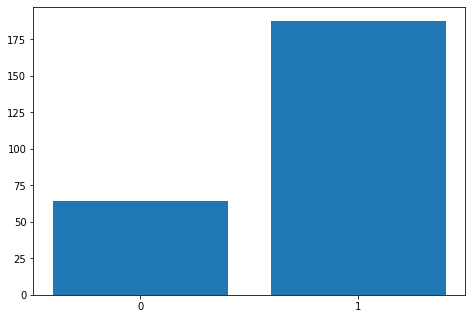

In [0]:
# Membuat visualisasi data jumlah penderita parkinson dan jumlah orang yang sehat
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
class1 = ['0','1']
count = data2.groupby(['class']).size()
ax.bar(class1,count)
plt.show()

### Distributions

In [0]:
#Bagi kolom berdasarkan feature

baseline_features = data.iloc[0:,2:23] 

time_freq = data.iloc[0:, 23:34]

vocal_fold = data.iloc[0:,34:56] 

MFCC = data.iloc[0:,56:140] 

Wavelet = data.iloc[0:,140:322]

tqwt = data.iloc[0:,322:754]

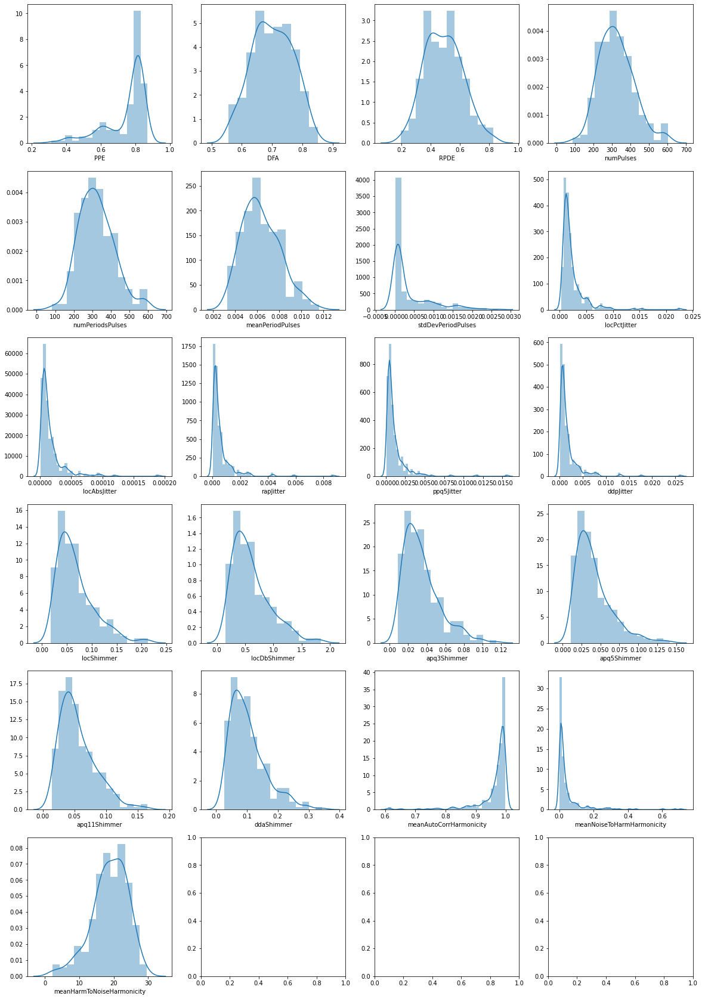

In [0]:
# membuat histogram baseline Features untuk melihat distribusi data
fig, axes = plt.subplots(nrows = 6, ncols = 4, figsize = (20, 30))
for i, ax in zip(range(21), axes.flat):
  sns.distplot(baseline_features.iloc[0:, i], ax = ax)

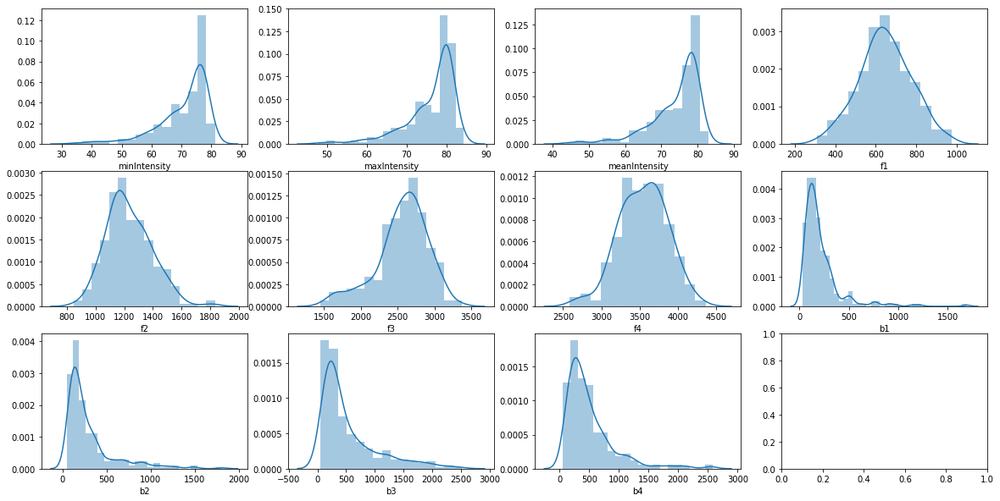

In [0]:
# membuat histogram Time Frequency Features untuk melihat distribusi data
fig, axes = plt.subplots(nrows = 3, ncols = 4, figsize = (20, 10))
for i, ax in zip(range(11), axes.flat):
  sns.distplot(time_freq.iloc[0:, i], ax = ax)

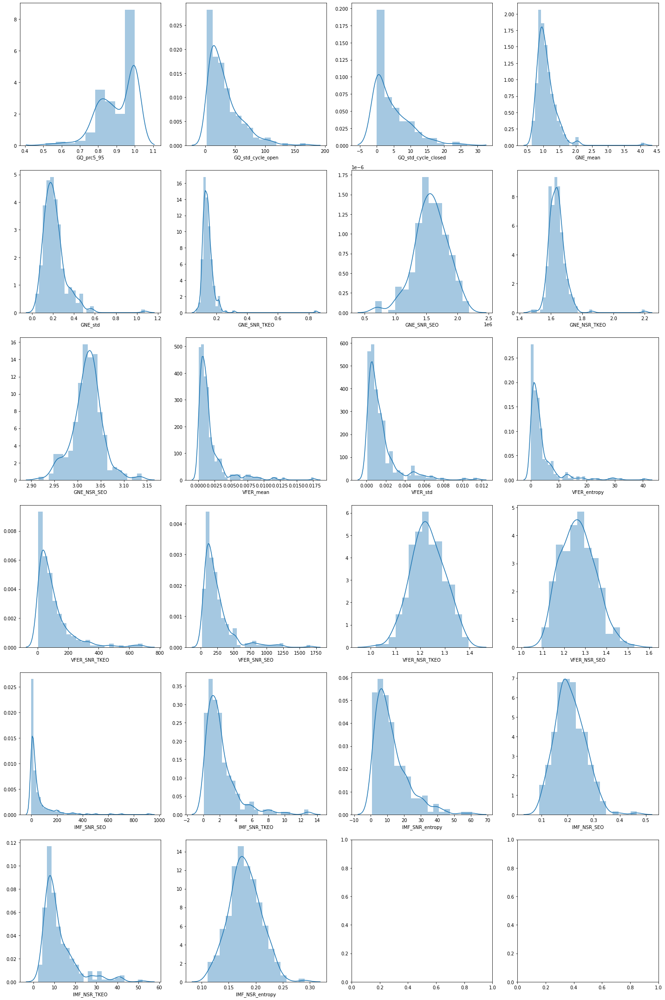

In [0]:
# membuat histogram vocal fold untuk melihat distribusi data
fig, axes = plt.subplots(nrows = 6, ncols = 4, figsize = (20, 30))
for i, ax in zip(range(22), axes.flat):
  sns.distplot(vocal_fold.iloc[0:, i], ax = ax)
fig.tight_layout()

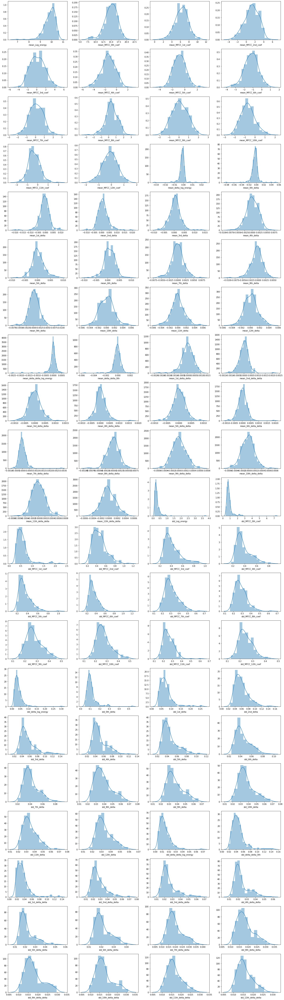

In [0]:
# membuat histogram MFCC untuk melihat distribusi data
fig, axes = plt.subplots(nrows = 21, ncols = 4, figsize = (20, 70))
for i, ax in zip(range(84), axes.flat):
  sns.distplot(MFCC.iloc[0:, i], ax = ax)
fig.tight_layout()

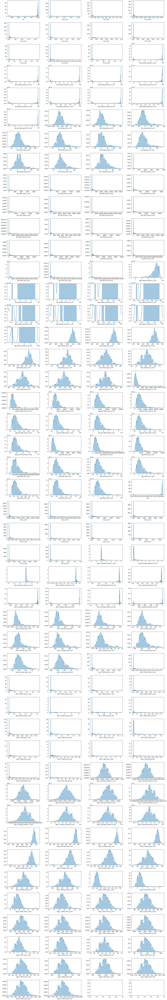

In [0]:
# membuat histogram Wavelet untuk melihat distribusi data
fig, axes = plt.subplots(nrows = 46, ncols = 4, figsize = (20, 120))
for i, ax in zip(range(182), axes.flat):
  sns.distplot(Wavelet.iloc[0:, i], ax = ax)
fig.tight_layout()

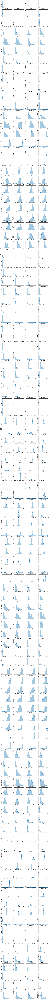

In [0]:
# membuat histogram tqwt untuk melihat distribusi data
fig, axes = plt.subplots(nrows = 108, ncols = 4, figsize = (20, 400))
for i, ax in zip(range(432), axes.flat):
  sns.distplot(tqwt.iloc[0:, i], ax = ax)
fig.tight_layout()

## Bivariate Analysis

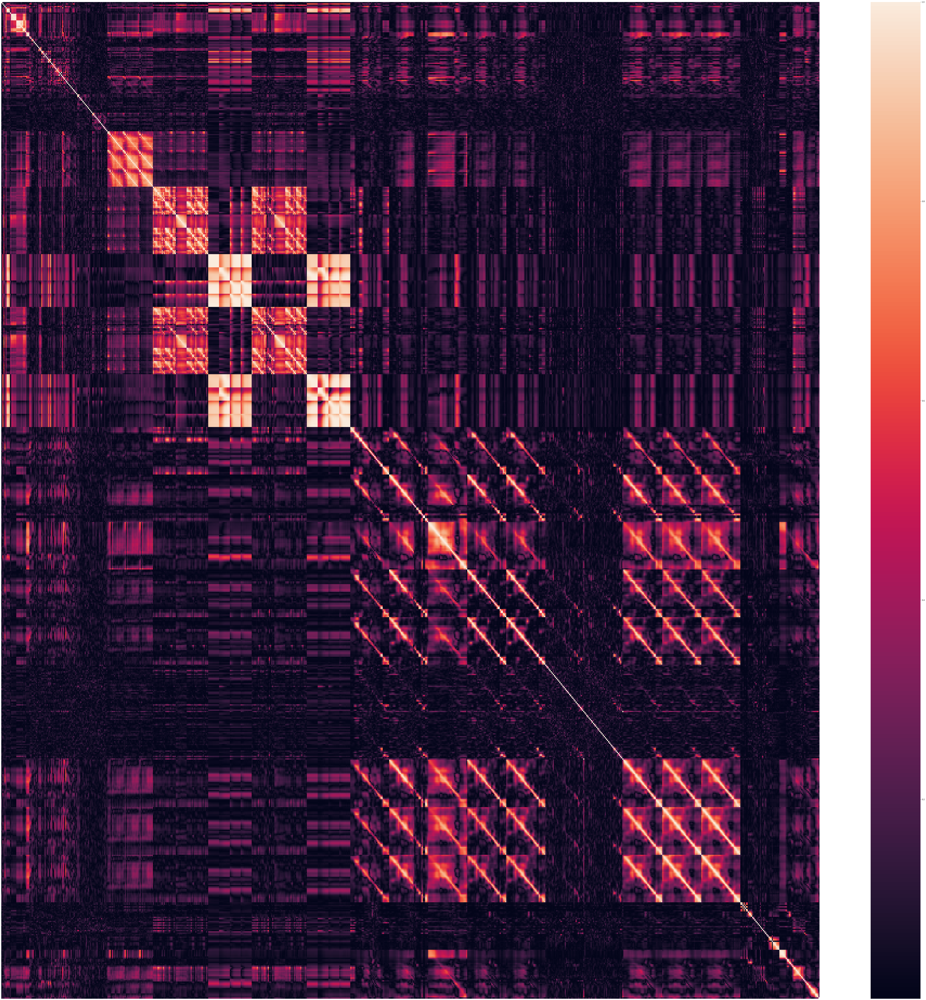

In [0]:
# membuat correlation matrix untuk memeriksa seluruh hubungan antar variabel numerik dalam dataset
corr = data.corr() 

fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (100, 100))
#terlalu banyak variable untuk membuat plot correlation matrix (tidak terlihat angkanya)
sns.heatmap(np.abs(corr), 
        xticklabels=[],
        yticklabels=[])

## Outlier Treatment

In [0]:
# Dengan metode IQR
outliers = {}
count_outlier_feature_wt = 0
for i in range(len(data.columns)):
  sort = np.array(sorted(data.iloc[0:, i]))
  Q1 = np.quantile(sort, 0.25)
  Q3 = np.quantile(sort, 0.75)
  IQR = Q3-Q1
  
  outlier_counts = 0
  for j in range(len(sort)):
    if((sort[j] < (Q1 - 1.5 * IQR)) | (sort[j] > (Q3 + 1.5 * IQR))):
      outlier_counts += 1
  outliers[data.iloc[0:, i].name] = outlier_counts

print('Jumlah Data Outlier:')
outliers

Jumlah Data Outlier:


{'DFA': 0,
 'Ea': 149,
 'Ea2': 151,
 'Ed2_10_coef': 125,
 'Ed2_1_coef': 150,
 'Ed2_2_coef': 152,
 'Ed2_3_coef': 144,
 'Ed2_4_coef': 139,
 'Ed2_5_coef': 137,
 'Ed2_6_coef': 132,
 'Ed2_7_coef': 134,
 'Ed2_8_coef': 131,
 'Ed2_9_coef': 131,
 'Ed_10_coef': 124,
 'Ed_1_coef': 147,
 'Ed_2_coef': 155,
 'Ed_3_coef': 142,
 'Ed_4_coef': 141,
 'Ed_5_coef': 139,
 'Ed_6_coef': 130,
 'Ed_7_coef': 139,
 'Ed_8_coef': 130,
 'Ed_9_coef': 133,
 'GNE_NSR_SEO': 39,
 'GNE_NSR_TKEO': 23,
 'GNE_SNR_SEO': 24,
 'GNE_SNR_TKEO': 28,
 'GNE_mean': 35,
 'GNE_std': 41,
 'GQ_prc5_95': 34,
 'GQ_std_cycle_closed': 85,
 'GQ_std_cycle_open': 32,
 'IMF_NSR_SEO': 6,
 'IMF_NSR_TKEO': 58,
 'IMF_NSR_entropy': 7,
 'IMF_SNR_SEO': 92,
 'IMF_SNR_TKEO': 51,
 'IMF_SNR_entropy': 41,
 'PPE': 108,
 'RPDE': 0,
 'VFER_NSR_SEO': 3,
 'VFER_NSR_TKEO': 3,
 'VFER_SNR_SEO': 62,
 'VFER_SNR_TKEO': 60,
 'VFER_entropy': 70,
 'VFER_mean': 70,
 'VFER_std': 65,
 'app_LT_TKEO_mean_10_coef': 3,
 'app_LT_TKEO_mean_1_coef': 14,
 'app_LT_TKEO_mean_2_coef':

In [0]:
data_outlier = copy.deepcopy(data)
sorted(data_outlier)
Q1 = data_outlier.quantile(0.25)
Q3 = data_outlier.quantile(0.75)
IQR = Q3 - Q1

#Jika data yang outlier dihilangkan, maka semua data pada dataset hilang dan tidak bisa dipakai
df_out = data_outlier[~((data_outlier < (Q1 - 1.5 * IQR)) |(data_outlier > (Q3 + 1.5 * IQR))).any(axis=1)]
print(df_out.shape)

(0, 755)


#Data Preprocessing

## Grouping Dataset

In [0]:
# Pada data ini setiap orang (setiap ID) memiliki 3 data hasil test
# Jadi kita perlu membuat 3 data hasil test ini dapat diwakili oleh 1 baris data untuk masing-masing orang
# maka itu kami menghitung rata-rata dari hasil test tiap orang dan memberlakukannya sebagai kondisi dari orang tersebut

data = data.groupby('id', as_index=False).mean()
data.head()
print(data.shape)

(252, 755)


##Standardize dataset

In [0]:
# x sebagai measurement
x=data.drop(['id','class'], axis=1)

# y untuk dijadikan sebagai label
y=data['class'].astype('int')

In [0]:
# melakukan standarisasi data 
Z = pd.DataFrame(StandardScaler().fit_transform(x), columns = x.columns)
Z.head()

,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,locAbsJitter,rapJitter,ppq5Jitter,ddpJitter,locShimmer,locDbShimmer,apq3Shimmer,apq5Shimmer,apq11Shimmer,ddaShimmer,meanAutoCorrHarmonicity,meanNoiseToHarmHarmonicity,meanHarmToNoiseHarmonicity,minIntensity,maxIntensity,meanIntensity,f1,f2,f3,f4,b1,b2,b3,b4,GQ_prc5_95,GQ_std_cycle_open,GQ_std_cycle_closed,GNE_mean,GNE_std,GNE_SNR_TKEO,GNE_SNR_SEO,...,tqwt_skewnessValue_dec_33,tqwt_skewnessValue_dec_34,tqwt_skewnessValue_dec_35,tqwt_skewnessValue_dec_36,tqwt_kurtosisValue_dec_1,tqwt_kurtosisValue_dec_2,tqwt_kurtosisValue_dec_3,tqwt_kurtosisValue_dec_4,tqwt_kurtosisValue_dec_5,tqwt_kurtosisValue_dec_6,tqwt_kurtosisValue_dec_7,tqwt_kurtosisValue_dec_8,tqwt_kurtosisValue_dec_9,tqwt_kurtosisValue_dec_10,tqwt_kurtosisValue_dec_11,tqwt_kurtosisValue_dec_12,tqwt_kurtosisValue_dec_13,tqwt_kurtosisValue_dec_14,tqwt_kurtosisValue_dec_15,tqwt_kurtosisValue_dec_16,tqwt_kurtosisValue_dec_17,tqwt_kurtosisValue_dec_18,tqwt_kurtosisValue_dec_19,tqwt_kurtosisValue_dec_20,tqwt_kurtosisValue_dec_21,tqwt_kurtosisValue_dec_22,tqwt_kurtosisValue_dec_23,tqwt_kurtosisValue_dec_24,tqwt_kurtosisValue_dec_25,tqwt_kurtosisValue_dec_26,tqwt_kurtosisValue_dec_27,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36
0,0.968742,0.644033,-0.061035,0.615894,-0.952586,-0.947685,1.096458,-0.580628,-0.151679,-0.028997,-0.020720,0.009206,-0.020759,0.093117,0.095665,0.018307,0.184238,0.254418,0.018424,0.255305,-0.252400,0.100307,-0.488242,-0.405215,-0.479966,-0.749325,-1.306753,-0.467946,0.201173,-0.527265,-0.777962,-0.635070,-0.657131,-1.006423,-0.558029,-0.311329,-0.242112,-0.007339,-0.662049,-1.161514,...,0.276374,0.467959,0.324319,0.349471,0.632139,0.719260,0.570844,1.013673,0.950974,0.285400,0.018422,-0.087138,-0.076478,-0.106295,-0.183530,0.692242,0.135787,-0.166723,0.052785,1.109205,0.308413,0.200447,0.238212,-0.403355,1.143539,-0.129554,-0.364120,-0.242781,-0.153746,-0.369030,-0.525210,-0.696264,-0.773319,-0.314607,-0.259138,-0.216181,-0.458937,-0.873305,-0.921798,-0.291014
1,-1.032266,-2.760921,1.414479,0.814426,-1.189035,-1.198004,1.487253,2.750745,1.456057,1.588784,1.378466,0.979312,1.379634,-0.127909,-0.118067,-0.207891,-0.197933,-0.050106,-0.207833,-0.189181,0.182844,-0.158872,0.573420,0.751741,0.733031,1.443042,-0.191969,1.731421,1.434856,0.394897,-0.310989,-0.427475,0.041926,-0.057083,3.131834,2.587325,-0.782612,-0.246952,0.054195,1.063868,...,-0.408832,0.092047,-0.296027,0.047021,-0.223408,-0.255732,-0.250222,-0.252440,-0.255320,-0.172603,-0.051032,0.003675,0.010011,0.232984,2.376044,-0.143318,0.466930,1.090894,1.269090,1.153789,1.613631,1.182271,0.182639,-0.436304,-0.546569,0.472473,-0.016624,-0.197336,-0.175203,-0.361475,-0.376839,-0.601575,-0.697268,-0.623142,-0.328841,-0.442934,-0.333330,-0.754354,-0.854172,-0.920017
2,0.968742,0.465219,-1.215823,0.248135,-0.049779,-0.046537,-0.188292,-0.523098,-0.045244,-0.162122,-0.318660,-0.208268,-0.317431,-0.707746,-0.756266,-0.763761,-0.638057,-0.491454,-0.763649,0.449645,-0.406300,0.305664,0.506874,0.354056,0.431844,0.280438,-0.510484,1.172617,1.018830,-0.447917,-0.740403,-0.734003,0.022310,0.952255,-0.876464,-0.838849,-0.806847,-1.213593,0.194941,-0.482407,...,-0.167307,-0.823479,-0.602658,-0.047888,-0.347668,-0.274074,-0.267860,-0.269479,-0.269268,-0.228601,-0.196609,-0.246422,-0.193491,-0.188156,-0.302927,-0.279533,-0.310772,-0.404215,-0.612306,-0.758127,-0.490140,-0.496837,0.228168,0.338017,-0.846896,-0.932118,-0.435878,-0.079045,-0.184196,-0.369066,-0.524254,0.419853,0.323445,-0.200144,-0.525440,-0.598422,-0.570513,-0.455877,-0.253479,-0.883111
3,-1.032266,0.688458,-1.123172,0.379054,1.816737,1.816550,-1.442328,-0.639406,-0.658648,-0.664841,-0.586428,-0.587782,-0.586448,-0.480857,-0.448652,-0.446293,-0.579261,-0.388426,-0.446236,

# Dimensionality reduction (PCA)

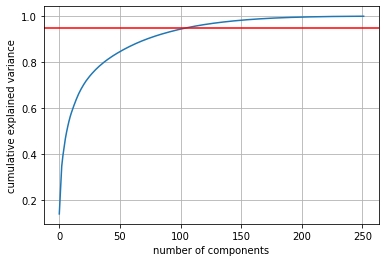

In [0]:
# Menentukan jumlah komponen minimal yang dapat mewakili keseluruhan data
# Disini kami ingin mencari tahu berapa banyak komponen yang diperlukan untuk mewakili 95% dari data (dengan mereduksi data)
pca = PCA().fit(Z)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.axhline(y=0.95, color='r', linestyle='-')
plt.grid()

In [0]:
# Disini kami ingin mencari tahu berapa banyak komponen yang diperlukan untuk mewakili 95% dari data
#95% variance
pca = PCA(n_components = 0.95)
Z_PCA = pca.fit_transform(Z)
X = copy.deepcopy(Z_PCA)
Z_PCA.shape
# Didapatkan bahwa 107 komponen cukup untuk mewakili 95% dari data

(252, 107)

#Splitting Dataset

## Split Data

In [0]:
# Mebagi data menjadi data training dan data testing dari Z_PCA (data setelah di reduksi dengan PCA)
from sklearn.model_selection import train_test_split
xTrain, xTest, yTrain, yTest = train_test_split(X, y, test_size = 0.2, random_state = 0)

## Size of Training and Test Dataset

In [0]:
xTrain.shape

(201, 107)

In [0]:
xTest.shape

(51, 107)

In [0]:
yTrain.shape

(201,)

In [0]:
yTest.shape

(51,)

# Model Selection

## Cross Validation

In [0]:
# Melakukan Cross Validation untuk menentukan algoritma terbaik dalam klasifikasi parkinson
# Kami menggunakan Algoritma Logistic Regression, Naive Bayes, Neural Network, Random Forest, k-Nearest Neighbors, dan Support Vector Machine

#ignore warning yang muncul 
warnings.filterwarnings('ignore')

#membuat list untuk menaruh model
models = []
models.append(('LR',LogisticRegression(random_state=0)))
models.append(('KNN', KNeighborsClassifier()))
models.append(('SVM', svm.SVC(random_state=0)))
models.append(('NN', MLPClassifier(random_state=0)))
models.append(('NB', GaussianNB()))
models.append(('RF', RandomForestClassifier(random_state=0)))

#Evaluasi Model
results = []
 
names = []

for name, model in models:

  #mengukur waktu yang dibutuhkan untuk memproses data
  start = time.time()

  #menggunakan cross validation untuk mengecek akurasi
  cv_results = cross_val_score(model, X, y, cv=10, scoring ='accuracy')
  end = time.time()-start
  results.append(cv_results)
  names.append(name)

  #print hasil akurasi dan standar deviasi dari model
  msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
  print(msg)

  #cetak hasil waktu yang dibutuhkan
  print('Process time: ', end)

  print()


LR: 0.786308 (0.102111)
Process time:  0.3662400245666504

KNN: 0.802000 (0.054497)
Process time:  0.06902408599853516

SVM: 0.821538 (0.061998)
Process time:  0.11990094184875488

NN: 0.794462 (0.102677)
Process time:  4.677502393722534

NB: 0.714615 (0.096517)
Process time:  0.026418447494506836

RF: 0.765846 (0.045152)
Process time:  2.2966599464416504



## ROC

In [0]:
#ROC

#membuat list untuk model klasififikasi yang digunakan
classifiers = [LogisticRegression(random_state=0), 
               GaussianNB(), 
               KNeighborsClassifier(), 
               MLPClassifier(random_state=0),
               RandomForestClassifier(random_state=0),
               svm.SVC(probability=True, random_state=0)]

#menampung hasil fpr, tpr dan auc ke dalam dataframe
result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])


#melakukan perulangan sebanyak model klasifikasi untuk melakukan analisis ROC
for cls in classifiers:
    model = cls.fit(xTrain, yTrain)
    probs = model.predict_proba(xTest)
    yproba = probs[:,1]
    
    fpr, tpr, _ = roc_curve(yTest,  yproba)
    auc = roc_auc_score(yTest, yproba)
    
    result_table = result_table.append({'classifiers':cls.__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)
result_table.set_index('classifiers', inplace=True)

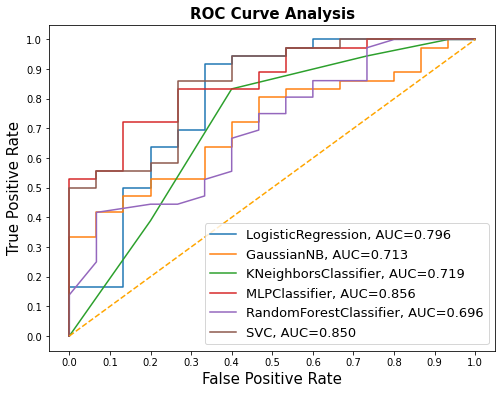

In [0]:
#Membuat plot ROC curve

fig = plt.figure(figsize=(8,6))

#mengulang sebanyak model klasifikasi untuk memperlihatkan model dalam 1 plot
for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
  
#memberikan label pada plot
plt.plot([0,1], [0,1], color='orange', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("False Positive Rate", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)

plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')

plt.show()

# Hyperparameter Tuning

##Grid Search

In [0]:
#GridSearch SVM

#ignore warning yang muncul 
warnings.filterwarnings('ignore')

#Membuat parameter dasar untuk grid search
grid_param = {'kernel':['linear', 'rbf', 'poly', 'sigmoid', 'radial'],
              'gamma':[1, 0.1, 0.01, 0.001, 0.0001],
              'C': [0.1, 1, 10, 100, 1000]}

start = time.time()
#melakukan cross validation dan melakukan permodelan dengan parameter yang sudah dibuat
clf = GridSearchCV(svm.SVC(random_state=0), grid_param, cv=10, scoring='accuracy')
clf.fit(X, y)
end = time.time()-start
#mencetak parameter dan score terbaik 
print("Best Parameter: ", clf.best_params_)
print("Best estimator: ", clf.best_estimator_)
print("Best Accuracy: ", clf.best_score_)
print("Process Time: ", end)

Best Parameter:  {'C': 10, 'gamma': 0.0001, 'kernel': 'rbf'}
Best estimator:  SVC(C=10, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.0001, kernel='rbf',
    max_iter=-1, probability=False, random_state=0, shrinking=True, tol=0.001,
    verbose=False)
Best Accuracy:  0.8573846153846153
Process Time:  11.116073608398438


In [0]:
# Grid Search MLP

#ignore warning yang muncul 
warnings.filterwarnings('ignore')

grid_param = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
    'max_iter': [100, 200, 300]
}

mlp = MLPClassifier(random_state = 0)

start = time.time()
#melakukan cross validation dan melakukan permodelan dengan parameter yang sudah dibuat
clf = GridSearchCV(mlp, grid_param, cv=10, scoring='accuracy')
clf.fit(X, y)
end = time.time()-start

#mencetak parameter dan score terbaik
print("Best Parameter: ", clf.best_params_)
print("Best estimator: ", clf.best_estimator_)
print("Best Accuracy: ", clf.best_score_)
print("Process Time: ", end)

Best Parameter:  {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (50, 100, 50), 'learning_rate': 'constant', 'max_iter': 100, 'solver': 'adam'}
Best estimator:  MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(50, 100, 50), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=100,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=0, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)
Best Accuracy:  0.813846153846154
Process Time:  1023.7508215904236


## Random Search

In [0]:
#Random Search SVM


#ignore warning yang muncul 
warnings.filterwarnings('ignore')

#Membuat initial parameter
grid_param = {'kernel':['linear', 'rbf', 'poly', 'sigmoid', 'radial',],
              'gamma':[1, 0.1, 0.01, 0.001, 0.0001],
              'C': [0.1, 1, 10, 100, 1000]}

start = time.time()
#melakukan random search dengan parameter yang ditentukan dan melakukan CV 
random_search = RandomizedSearchCV(svm.SVC(random_state=0), param_distributions = grid_param, n_iter=100, cv=10)
random_search.fit(X, y)
end = time.time()-start

#mencetak parameter dan akurasi terbaik
print("Best parameter : ", random_search.best_params_)
print("Best estimator: ", random_search.best_estimator_)
print("Best Accuracy: ", random_search.best_score_)
print("Process Time: ", end)

Best parameter :  {'kernel': 'rbf', 'gamma': 0.0001, 'C': 100}
Best estimator:  SVC(C=100, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.0001, kernel='rbf',
    max_iter=-1, probability=False, random_state=0, shrinking=True, tol=0.001,
    verbose=False)
Best Accuracy:  0.8418461538461537
Process Time:  8.184845209121704


In [0]:
# Random Search MLP

#ignore warning yang muncul 
warnings.filterwarnings('ignore')

grid_param = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
    'max_iter': [100, 200, 300]
}

mlp = MLPClassifier(random_state = 0)

start = time.time()
#melakukan random search dengan parameter yang ditentukan dan melakukan CV sebanyak 10
random_search = RandomizedSearchCV(mlp, param_distributions = grid_param, n_iter=100, cv=10)
random_search.fit(X, y)
end = time.time()-start

#mencetak parameter dan score terbaik
print("Best Parameter: ", clf.best_params_)
print("Best estimator: ", clf.best_estimator_)
print("Best Accuracy: ", clf.best_score_)
print("Process Time: ", end)

Best Parameter:  {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (50, 100, 50), 'learning_rate': 'constant', 'max_iter': 100, 'solver': 'adam'}
Best estimator:  MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(50, 100, 50), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=100,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=0, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)
Best Accuracy:  0.813846153846154
Process Time:  689.3048770427704


# Model Evaluation

## Before Tuning

Default Model SVM Stats:
---------------------------------------------
Before Cross Validation : 
Accuracy Score	: 0.824
Precision Score	: 0.814
Recall Score	: 0.972
F1-Score	: 0.886

---------------------------------------------
After Cross Validation : 
accuracy score	: 0.822
precision score	: 0.819
recall score	: 0.978
f1 score	: 0.891
---------------------------------------------



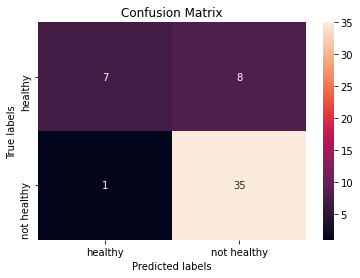

In [0]:
#SVM

#Melakukan permodelan dengan parameter default
def_svc = svm.SVC(random_state=0)
def_svc.fit(xTrain, yTrain)

print('Default Model SVM Stats:')

print('---------------------------------------------')
print('Before Cross Validation : ')
#Mencetak akurasi, precision, recall dan f1 score yang didapat dari model
def_y_pred = def_svc.predict(xTest)
print('Accuracy Score\t: {:.3f}'.format(accuracy_score(yTest,def_y_pred)))
print('Precision Score\t: {:.3f}'.format(precision_score(yTest,def_y_pred)))
print('Recall Score\t: {:.3f}'.format(recall_score(yTest,def_y_pred)))
print('F1-Score\t: {:.3f}'.format(f1_score(yTest,def_y_pred)))

print()
print('---------------------------------------------')

score =['accuracy', 'precision', 'recall', 'f1']

print("After Cross Validation : ")
for scr in score:
  cv = cross_val_score(def_svc, X, y, cv=10, scoring=scr)
  print("{} score\t: {:.3f}".format(scr, cv.mean()))

print('---------------------------------------------')
print()

#Membuat confusion matrix
cm = confusion_matrix(yTest, def_y_pred)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['healthy', 'not healthy']); ax.yaxis.set_ticklabels(['healthy', 'not healthy']);


Default Model MLP Stats:
---------------------------------------------
Before Cross Validation : 
Accuracy Score	: 0.765
Precision Score	: 0.800
Recall Score	: 0.889
F1-Score	: 0.842

---------------------------------------------
After Cross Validation : 
accuracy score	: 0.794
precision score	: 0.837
recall score	: 0.904
f1 score	: 0.868
---------------------------------------------



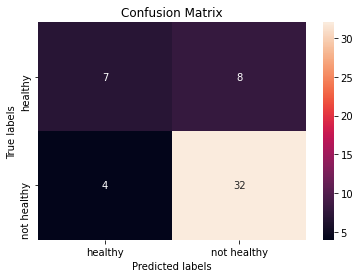

In [0]:
#MLP

#Melakukan permodelan dengan parameter default
def_mlp = MLPClassifier(random_state=0)
def_mlp.fit(xTrain, yTrain)

print('Default Model MLP Stats:')

print('---------------------------------------------')
print('Before Cross Validation : ')
#Mencetak akurasi, precision, recall dan f1 score yang didapat dari model
def_y_pred = def_mlp.predict(xTest)
print('Accuracy Score\t: {:.3f}'.format(accuracy_score(yTest,def_y_pred)))
print('Precision Score\t: {:.3f}'.format(precision_score(yTest,def_y_pred)))
print('Recall Score\t: {:.3f}'.format(recall_score(yTest,def_y_pred)))
print('F1-Score\t: {:.3f}'.format(f1_score(yTest,def_y_pred)))

print()
print('---------------------------------------------')

score =['accuracy', 'precision', 'recall', 'f1']

print("After Cross Validation : ")
for scr in score:
  cv = cross_val_score(def_mlp, X, y, cv=10, scoring=scr)
  print("{} score\t: {:.3f}".format(scr, cv.mean()))

print('---------------------------------------------')
print()

#Membuat confusion matrix
cm = confusion_matrix(yTest, def_y_pred)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['healthy', 'not healthy']); ax.yaxis.set_ticklabels(['healthy', 'not healthy']);

## After Tuning

Tune Model SVM Stats:
---------------------------------------------
Before Cross Validation : 
Accuracy Score	: 0.824
Precision Score	: 0.829
Recall Score	: 0.944
F1-Score	: 0.883

---------------------------------------------
After Cross Validation : 
accuracy score	: 0.857
precision score	: 0.850
recall score	: 0.989
f1 score	: 0.913
---------------------------------------------





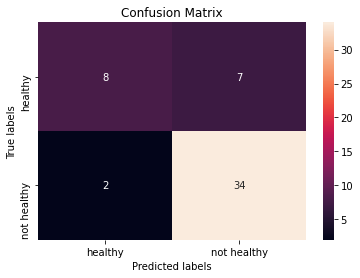

In [0]:
#grid svm

#Membuat model dengan parameter terbaik dari hyperparameter tuning
svc_hyper = svm.SVC(random_state=0, C=10, gamma=0.0001, kernel='rbf')
svc_hyper.fit(xTrain, yTrain)

print('Tune Model SVM Stats:')

print('---------------------------------------------')
print('Before Cross Validation : ')
#Mencetak akurasi, precision, recall dan f1 score yang didapat dari model
def_y_pred = svc_hyper.predict(xTest)
print('Accuracy Score\t: {:.3f}'.format(accuracy_score(yTest,def_y_pred)))
print('Precision Score\t: {:.3f}'.format(precision_score(yTest,def_y_pred)))
print('Recall Score\t: {:.3f}'.format(recall_score(yTest,def_y_pred)))
print('F1-Score\t: {:.3f}'.format(f1_score(yTest,def_y_pred)))

print()
print('---------------------------------------------')

score =['accuracy', 'precision', 'recall', 'f1']

print("After Cross Validation : ")
for scr in score:
  cv = cross_val_score(svc_hyper, X, y, cv=10, scoring=scr)
  print("{} score\t: {:.3f}".format(scr, cv.mean()))

print('---------------------------------------------')
print()

#Buat confusion matrix
print()
cm = confusion_matrix(yTest, def_y_pred)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['healthy', 'not healthy']); ax.yaxis.set_ticklabels(['healthy', 'not healthy']);

print()

Tuned MLP Model Stats:
---------------------------------------------
Before Cross Validation : 
Accuracy Score	: 0.784
Precision Score	: 0.821
Recall Score	: 0.889
F1-Score	: 0.853

---------------------------------------------
After Cross Validation : 
accuracy score	: 0.814
precision score	: 0.856
recall score	: 0.908
f1 score	: 0.878
---------------------------------------------





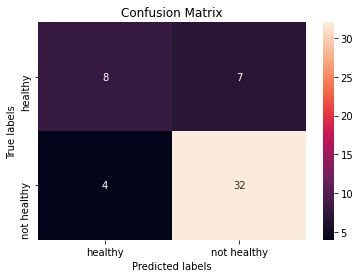

In [0]:
#grid MLP

#Membuat model dengan parameter terbaik dari hyperparameter tuning
MLP_hyper = MLPClassifier(random_state=0, activation = 'relu', alpha = 0.0001, hidden_layer_sizes = (50, 100, 50),
                          learning_rate = 'constant', solver = 'adam', max_iter=100)
MLP_hyper.fit(xTrain, yTrain)

print('Tuned MLP Model Stats:')

print('---------------------------------------------')
print('Before Cross Validation : ')
#Mencetak akurasi, precision, recall dan f1 score yang didapat dari model
def_y_pred = MLP_hyper.predict(xTest)
print('Accuracy Score\t: {:.3f}'.format(accuracy_score(yTest,def_y_pred)))
print('Precision Score\t: {:.3f}'.format(precision_score(yTest,def_y_pred)))
print('Recall Score\t: {:.3f}'.format(recall_score(yTest,def_y_pred)))
print('F1-Score\t: {:.3f}'.format(f1_score(yTest,def_y_pred)))

print()
print('---------------------------------------------')

score =['accuracy', 'precision', 'recall', 'f1']

print("After Cross Validation : ")
for scr in score:
  cv = cross_val_score(MLP_hyper, X, y, cv=10, scoring=scr)
  print("{} score\t: {:.3f}".format(scr, cv.mean()))

print('---------------------------------------------')
print()

# buat confusion matrix
print()
cm = confusion_matrix(yTest, def_y_pred)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['healthy', 'not healthy']); ax.yaxis.set_ticklabels(['healthy', 'not healthy']);

print()

## ROC Analysis

In [0]:
#ROC

#Membuat variabel untuk menampung model dengan parameter terbaik dari tuning
classifiers = [MLPClassifier(random_state=0, activation = 'relu', alpha = 0.0001, hidden_layer_sizes = (50, 100, 50),
                          learning_rate = 'constant', solver = 'adam', max_iter = 100), 
               svm.SVC(probability=True, random_state=0, C=10, gamma=0.0001, kernel='rbf')]

#membuat dataframe untuk menampung fpr, tpr dan auc
result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])


#Menghitung score AUC dari tiap model
for cls in classifiers:
    model = cls.fit(xTrain, yTrain)
    probs = model.predict_proba(xTest)
    yproba = probs[:,1]
    
    fpr, tpr, _ = roc_curve(yTest,  yproba)
    auc = roc_auc_score(yTest, yproba)
    
    result_table = result_table.append({'classifiers':cls.__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)
result_table.set_index('classifiers', inplace=True)

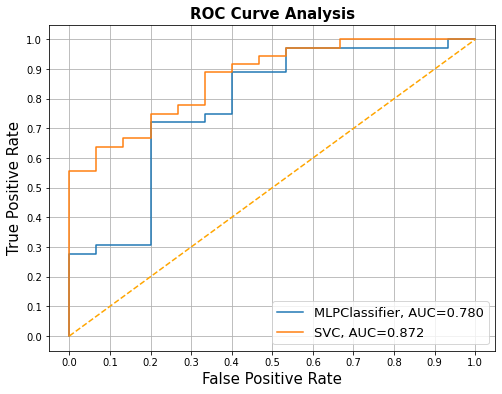

In [0]:
fig = plt.figure(figsize=(8,6))

#Plot model sebanyak model klasifikasi yang ada
for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
    
plt.plot([0,1], [0,1], color='orange', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("False Positive Rate", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)

plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')

plt.grid()
plt.show()

# Model Deployment

## Support Vector Machine

In [0]:
#Persist model on the disk as a file
joblib.dump(svc_hyper, 'SVM_Model.pkl')

['SVM_Model.pkl']

In [0]:
#Load object in memory
svm_model=joblib.load('SVM_Model.pkl')
svm_model

SVC(C=10, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.0001, kernel='rbf',
    max_iter=-1, probability=False, random_state=0, shrinking=True, tol=0.001,
    verbose=False)

In [0]:
#Melakukan prediksi dari model
print(svm_model.predict(xTest[10:11]), yTest[10:11])

[0] 149    0
Name: class, dtype: int64


## MLP

In [0]:
#Persist model on the disk as a file
joblib.dump(MLP_hyper, 'MLP_Model.pkl')

['MLP_Model.pkl']

In [0]:
#Load object in memory
MLP_model=joblib.load('MLP_Model.pkl')
MLP_model

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(50, 100, 50), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=100,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=0, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

In [0]:
#Melakukan prediksi dari model
print(MLP_model.predict(xTest[10:11]), yTest[10:11])

[1] 149    0
Name: class, dtype: int64
